In [2]:
import pandas as pd
import numpy as np
import os
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
import matplotlib.pyplot as plt
from scipy import signal
import glob
import antropy
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from scipy.signal import butter, sosfilt, sosfreqz, detrend,stft
import math
from scipy.signal import stft,find_peaks
from scipy.stats import kurtosis,skew
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler,StandardScaler

### Feature Extraction from segmented Prox and IMU timeseries

In [3]:
### Read the detrended data
sensor_ts_df = pd.read_parquet(r"D:\Angela\NUS\eating_detection\sensor_ts_df_4.parquet")

In [4]:
sensor_ts_df

,data_pt,label,label_chewing,label_eating,File,IMU_1_x,IMU_1_y,IMU_1_z,Prox,IMU_2_x,IMU_2_y,IMU_2_z
0,0.0,nan,0.0,0,D:\Angela\NUS\eating_detection\original_data\7...,0.140758,0.018524,0.260266,-197.279158,-0.051361,-0.242846,-0.083121
1,1.0,nan,0.0,0,D:\Angela\NUS\eating_detection\original_data\7...,0.140754,0.018524,0.270266,-196.288947,-0.051356,-0.252834,-0.093125
2,2.0,nan,0.0,0,D:\Angela\NUS\eating_detection\original_data\7...,0.110750,-0.001475,0.280266,-200.298736,-0.051351,-0.232822,-0.053129
3,3.0,nan,0.0,0,D:\Angela\NUS\eating_detection\original_data\7...,0.150746,-0.001475,0.280267,-217.308525,-0.061346,-0.282810,-0.133134
4,4.0,nan,0.0,0,D:\Angela\NUS\eating_detection\original_data\7...,0.150742,-0.001474,0.290267,-222.318314,-0.041341,-0.222799,-0.033138
...,...,...,...,...,...,...,...,...,...,...,...,...
1076335,2921.0,nan,0.0,0,D:\Angela\NUS\eating_detection\original_data\7...,-0.057554,0.037783,-0.141262,223.914422,0.001778,0.147526,0.053525
1076336,2922.0,nan,0.0,0,D:\Angela\NUS\eating_detection\original_data\7...,-0.067497,0.017778,-0.141266,218.889502,-0.028247,0.147487,0.083555
1076337,2923.0,nan,0.0,0,D:\Angela\NUS\eating_detection\original_data\7...,-0.077440,0.017772,-0.131270,214.864582,-0.018272,0.147448,0.053585
1076338,2924.0,nan,0.0,0,D:\Angela\NUS\eating_detection\original_data\7...,-0.087383,0.017767,-0.131274,205.839661,-0.018297,0.147409,0.043615


In [5]:
sensor_list = ['IMU_1_x','IMU_1_y','IMU_1_z','Prox','IMU_2_x','IMU_2_y','IMU_2_z']

### Filter out suddent spikes in Proximity sensor

In [6]:
### Set threshold at 3 std above the mean difference from the previous data point
sensor_ts_df['Prox'].diff().mean()+3*sensor_ts_df['Prox'].diff().std()

97.59307820584146

##### Feature set for Proximity sensor according to *A Novel Peak Detection Algorithm Using Particl Swarm Optimization for Chew Count Estimation of a Contactless Chewing Detection* and *A glasses-type wearable device for monitoring the patterns of food intake and facial activity*

In [7]:
window_size = 120
window_step = 60
start = 0
end = len(sensor_ts_df) -  window_size

In [8]:
def count_zero_crossings(arr):
    return ((arr[:-1].to_numpy() * arr[1:].to_numpy()) < 0).sum()

def find_ten_largest_fft(fft):
    fft_abs = np.abs(fft)
    one_sided_fft = 2*fft_abs[0:int(len(fft)/2.)]/(len(fft)/2)
    new_X = np.linspace(0, int(60/2), int((len(fft)/2)), endpoint=True)
    sorted_idx = np.argsort(one_sided_fft)
    ten_largest_freq = new_X[sorted_idx][-10:]
    ten_largest_freq_magnitude = one_sided_fft[sorted_idx][-10:]
    return ten_largest_freq,ten_largest_freq_magnitude

def find_freq_energy(signal,lower,upper):
    fft_abs = np.abs(signal)
    one_sided_fft = 2*fft_abs[0:int(len(fft_abs)/2.)]/(len(fft_abs)/2)
    freq_energy = (one_sided_fft[int(lower/0.5):int(upper/0.5)+1]**2).sum()
    return freq_energy

def get_spec_energy(fft):
    return np.sum(np.real(fft)*np.real(fft) + np.imag(fft)*np.imag(fft))

def filtering(signal,lowcut,highcut,fs):
    
    def butter_bandpass(lowcut, highcut, fs, order=5):
        nyquist = 0.5 * fs
        low = lowcut / nyquist
        high = highcut / nyquist
        sos = butter(order, [low, high], btype='band', output='sos')
        return sos

    sos = butter_bandpass(lowcut, highcut, fs)

    filtered_data = sosfilt(sos, signal)
    return filtered_data

def plot_fft(signal,ax):
    signal = signal - signal.mean()
    FFT =np.fft.fft(signal)
    new_N=int(len(FFT)/2) 
    f_nat=60
    new_X = np.linspace(10**-12, f_nat/2, new_N, endpoint=True)
    FFT_abs=np.abs(FFT)
    ax.plot(new_X,2*FFT_abs[0:int(len(FFT)/2.)]/len(new_X),color='black')

In [9]:
feature_set = {'MAV':[],'min_t':[],'max_t':[],'range':[],'rms':[],'median':[],'variance':[],'std':[],'skewness':[],'kurtosis':[],'IQR':[],'mean_freq':[],'median_freq':[],'min_PSD':[],'max_PSD':[],'mean_PSD':[],'std_PSD':[],'median_PSD':[],'skewness_PSD':[],'kurtosis_PSD':[],'spectral_kurtosis':[],'spectral_entropy':[],'kurtosis_STFT':[],'skewness_STFT':[],'freq_band_q1':[],'freq_band_q2':[],'freq_band_q3':[],'freq_band_q4':[],'num_peaks':[],'zero_crossings':[]}
label_chewing_detection = []
label_chewing_count = []
window_size = 120
window_step = 60
start = 0
end = len(sensor_ts_df) - 1
for win_start in range(start,end,window_step):
    win_end = win_start + window_size
    if win_end >= end:
        break
    frame = sensor_ts_df.iloc[win_start:win_end]
    if frame.iloc[-1]['data_pt'] < frame.iloc[0]['data_pt']:
        continue
    Prox_demean = frame['Prox']
    if np.any(np.abs(Prox_demean.diff()) > 100): ## discard the window if it contains diff above the threshold
        continue
    feature_set['MAV'].append(Prox_demean.abs().mean())
    feature_set['min_t'].append(Prox_demean.min())
    feature_set['max_t'].append(Prox_demean.max())
    feature_set['range'].append(Prox_demean.max()-Prox_demean.min())
    feature_set['rms'].append(math.sqrt((Prox_demean**2).sum()))
    feature_set['median'].append(Prox_demean.quantile(0.5))
    feature_set['variance'].append((Prox_demean.std())**2)
    feature_set['std'].append(Prox_demean.std())
    feature_set['skewness'].append(Prox_demean.skew())
    feature_set['kurtosis'].append(kurtosis(Prox_demean))
    feature_set['IQR'].append(Prox_demean.quantile(0.75)-Prox_demean.quantile(0.25))
    f, Pxx_dens = signal.periodogram(Prox_demean,fs = 60,window = 'hann')
    feature_set['mean_freq'].append((f*Pxx_dens).sum()/Pxx_dens.sum())
    feature_set['median_freq'].append(Pxx_dens.sum()/2)
    f_stft,t_stft,Zxx = stft(Prox_demean,fs = 60,nperseg = 30,scaling = 'psd')
    feature_set['min_PSD'].append(Pxx_dens.min())
    feature_set['max_PSD'].append(Pxx_dens.max())
    feature_set['mean_PSD'].append(Pxx_dens.mean())
    feature_set['std_PSD'].append(Pxx_dens.std())
    feature_set['median_PSD'].append(np.quantile(Pxx_dens,0.5))
    feature_set['skewness_PSD'].append(skew(Pxx_dens))
    feature_set['kurtosis_PSD'].append(kurtosis(Pxx_dens))
    feature_set['spectral_kurtosis'].append(((np.abs(Zxx)**4).mean(axis = 1) / ((np.abs(Zxx)**2).mean(axis = 1))**2 - 2).mean())
    feature_set['spectral_entropy'].append(antropy.spectral_entropy(Prox_demean, sf=60, method='welch', normalize=True))
    feature_set['kurtosis_STFT'].append(kurtosis(np.abs(Zxx),axis = None))
    feature_set['skewness_STFT'].append(skew(np.abs(Zxx),axis = None))
    for i in np.arange(0.5,5.5,0.5).tolist():
        if f'Freq_{i}' in feature_set.keys():
            feature_set[f'Freq_{i}'].append(Pxx_dens[int(i/0.5)])
        else:
            feature_set[f'Freq_{i}'] = [Pxx_dens[int(i/0.5)]]
    FFT = np.fft.fft(Prox_demean)
    ten_largest_fft_idx,ten_largest_fft_mag = find_ten_largest_fft(FFT)
    for i in range(10):
        if (f'Freq_{i}_idx' in feature_set.keys()) and (f'Freq_{i}_mag' in feature_set.keys()):
            feature_set[f'Freq_{i}_idx'].append(ten_largest_fft_idx[i])
            feature_set[f'Freq_{i}_mag'].append(ten_largest_fft_mag[i])
        else:
            feature_set[f'Freq_{i}_idx'] = [ten_largest_fft_idx[i]]
            feature_set[f'Freq_{i}_mag'] = [ten_largest_fft_mag[i]]
    total_energy = get_spec_energy(FFT)
    feature_set['freq_band_q1'].append(find_freq_energy(FFT,0.5,2.5)/total_energy)
    feature_set['freq_band_q2'].append(find_freq_energy(FFT,3.0,5.0)/total_energy)
    feature_set['freq_band_q3'].append(find_freq_energy(FFT,5.5,17.5)/total_energy)
    feature_set['freq_band_q4'].append(find_freq_energy(FFT,18,30.0)/total_energy)
    feature_set['num_peaks'].append(len(find_peaks(Prox_demean,height = 100, prominence = 6)[0]))
    if frame['label_eating'].mean() > 0.5:
        label_chewing_detection.append(1)
        label_chewing_count.append(frame['label_chewing'].sum())
    else:
        label_chewing_detection.append(0)
        label_chewing_count.append(0)
    feature_set['zero_crossings'].append(count_zero_crossings(Prox_demean))
chewing_detection_label = pd.DataFrame(label_chewing_detection).rename(columns = {0:'chewing_detection'})
chewing_count_label = pd.DataFrame(label_chewing_count).rename(columns = {0:'chewing_count'})
features = pd.DataFrame.from_dict(feature_set)
features.columns = [f'Prox_{i}' for i in list(feature_set.keys())]
Prox_features = features
chewing_labels = pd.concat([chewing_detection_label,chewing_count_label],axis = 1)

d:\ProgramFiles\anaconda\envs\mnn\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 120, using nperseg = 120
  warnings.warn('nperseg = {0:d} is greater than input length '
d:\ProgramFiles\anaconda\envs\mnn\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 120, using nperseg = 120
  warnings.warn('nperseg = {0:d} is greater than input length '
d:\ProgramFiles\anaconda\envs\mnn\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 120, using nperseg = 120
  warnings.warn('nperseg = {0:d} is greater than input length '
d:\ProgramFiles\anaconda\envs\mnn\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 120, using nperseg = 120
  warnings.warn('nperseg = {0:d} is greater than input length '
d:\ProgramFiles\anaconda\envs\mnn\lib\site-packages\scipy\si

In [14]:
Prox_features

,Prox_MAV,Prox_min_t,Prox_max_t,Prox_range,Prox_rms,Prox_median,Prox_variance,Prox_std,Prox_skewness,Prox_kurtosis,...,Prox_Freq_5_idx,Prox_Freq_5_mag,Prox_Freq_6_idx,Prox_Freq_6_mag,Prox_Freq_7_idx,Prox_Freq_7_mag,Prox_Freq_8_idx,Prox_Freq_8_mag,Prox_Freq_9_idx,Prox_Freq_9_mag
0,155.786007,-214.971172,-97.264847,117.706326,1740.922852,-153.480208,995.788210,31.556112,-0.315633,-0.712742,...,0.508475,32.525816,2.033898,32.572956,2.542373,33.196948,1.525424,56.920547,0.000000,623.144026
1,121.556689,-163.460630,-81.322074,82.138555,1361.962935,-118.847301,687.559776,26.221361,-0.150805,-1.251001,...,2.033898,7.022065,3.050847,7.765715,1.016949,28.216039,0.508475,65.679420,0.000000,486.226754
2,92.234071,-133.791953,82.335306,216.127259,1050.243075,-90.983595,2072.599844,45.525815,2.139841,4.336602,...,3.050847,43.205825,2.033898,54.337543,2.542373,59.908082,0.508475,60.964908,0.000000,337.909482
3,187.555780,-289.572070,-46.023878,243.548192,2138.414917,-192.969284,2954.267758,54.353176,0.438663,0.221319,...,2.542373,46.857232,2.033898,47.482846,1.525424,59.282977,0.508475,102.162384,0.000000,750.223122
4,219.801462,-356.012582,-75.169208,280.843374,2510.504445,-225.753169,4244.627071,65.150803,0.174975,-0.144710,...,2.542373,50.299056,2.033898,50.996347,1.016949,97.900040,1.525424,127.459546,0.000000,879.205850
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10308,42.806541,-75.363452,62.315769,137.679221,521.900199,-42.217115,1495.884490,38.676666,0.598523,-1.060041,...,4.067797,14.278868,1.016949,22.164632,2.033898,25.939392,0.508475,96.373715,0.000000,112.172227
10309,29.706007,-75.363452,75.016725,150.380177,396.567819,16.276796,1222.662041,34.966585,-0.832236,0.306182,...,1.016949,31.259126,2.542373,32.208308,0.000000,39.613554,1.525424,49.994569,0.508475,55.935861
10310,39.906633,-59.257399,75.016725,134.274124,484.873740,41.619592,683.855163,26.150625,-1.329752,2.021479,...,2.542373,20.811390,2.033898,22.555501,1.016949,22.997514,0.508475,52.904920,0.000000,143.166001
10311,42.979612,6.805184,69.599450,62.794266,491.467578,42.974848,166.980952,12.922111,-0.064173,-0.428379,...,2.542373,6.778051,1.525424,11.269924,1.016949,19.872271,0.508475,20.862468,0.000000,171.918448


In [128]:
Prox_features.to_parquet(r'./Prox_features_60.parquet') ## Export extracted features

In [21]:
non_chewing_count = chewing_labels[chewing_labels['chewing_detection'] == 0].shape[0]
chewing_count = chewing_labels[chewing_labels['chewing_detection'] == 1].shape[0]

In [129]:
## Split into train, validation, and test sets
test_size = 0.2
X_rest, X_test, y_rest, y_test = train_test_split(Prox_features, chewing_labels['chewing_detection'], test_size=test_size)
valid_size = 0.2
X_train,X_valid,y_train,y_valid = train_test_split(X_rest,y_rest,test_size = valid_size)

In [153]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe
from sklearn.metrics import f1_score

space={'max_depth': hp.quniform("max_depth", 3, 25, 1),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 1, 10, 1),
        'n_estimators': 180,
        'seed': 0
    }

def objective(space):
    clf=XGBClassifier(objective = 'binary:logistic',
                    n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']),early_stopping_rounds=20,eval_metric = 'error')
    
    evaluation = [( X_train, y_train),( X_valid, y_valid)]
    
    clf.fit(X_train, y_train,
            eval_set=evaluation,verbose=False)
    
    pred = clf.predict(X_valid).round()
    accuracy = accuracy_score(y_valid, pred)
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }
    
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 300,
                        trials = trials)

SCORE:                                                 
0.5503030303030303                                     
SCORE:                                                                            
0.5503030303030303                                                                
SCORE:                                                                            
0.5503030303030303                                                                
SCORE:                                                                            
0.5503030303030303                                                                
SCORE:                                                                            
0.5503030303030303                                                                
SCORE:                                                                            
0.5503030303030303                                                                
SCORE:                                                    

In [154]:
best_hyperparams

{'colsample_bytree': 0.5912737655941546,
 'gamma': 1.0666447515025976,
 'max_depth': 18.0,
 'min_child_weight': 5.0,
 'reg_alpha': 45.0,
 'reg_lambda': 0.17690088887907102}

In [155]:
best_hyperparams['max_depth'] = int(best_hyperparams['max_depth'])

In [156]:
model_hyperopt = XGBClassifier(**best_hyperparams,n_estimators = 180,seed = 0)

In [157]:
model_hyperopt.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5912737655941546, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=1.0666447515025976,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=18, max_leaves=None,
              min_child_weight=5.0, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=180, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [158]:
y_pred = model_hyperopt.predict(X_test)
predictions = [round(value) for value in y_pred]
accuracy = metrics.accuracy_score(y_test, predictions)
precision = metrics.precision_score(y_test, predictions)
recall = metrics.recall_score(y_test, predictions)
f1_score = metrics.f1_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
print("Precision: %.2f%%" % (precision * 100.0))
print("Recall: %.2f%%" % (recall * 100.0))
print("f1_score: %.2f%%" % (f1_score * 100.0))

Accuracy: 57.68%
Precision: 57.70%
Recall: 38.17%
f1_score: 45.94%


In [159]:
print(metrics.classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.58      0.75      0.65      1091
           1       0.58      0.38      0.46       972

    accuracy                           0.58      2063
   macro avg       0.58      0.57      0.56      2063
weighted avg       0.58      0.58      0.56      2063



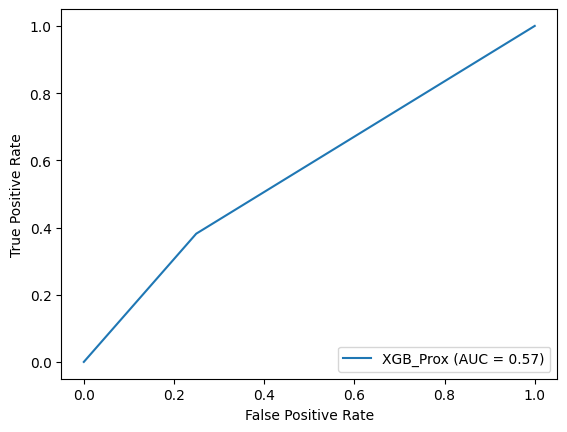

In [160]:
fpr, tpr, thresholds = metrics.roc_curve(y_test, predictions)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc,estimator_name='XGB_Prox')
display.plot()
plt.show()

In [107]:
def IMU_feature_extract(sensor):
    feature_set = {'MAV':[],'min_t':[],'max_t':[],'range':[],'rms':[],'median':[],'variance':[],'std':[],'skewness':[],'kurtosis':[],'IQR':[],'mean_freq':[],'median_freq':[],'min_PSD':[],'max_PSD':[],'mean_PSD':[],'std_PSD':[],'median_PSD':[],'skewness_PSD':[],'kurtosis_PSD':[],'spectral_kurtosis':[],'spectral_entropy':[],'kurtosis_STFT':[],'skewness_STFT':[],'freq_band_q1':[],'freq_band_q2':[],'freq_band_q3':[],'freq_band_q4':[],'num_peaks':[],'zero_crossings':[]}
    #label_chewing_detection = []
    #label_chewing_count = []
    window_size = 120
    window_step = 60
    start = 0
    end = len(sensor_ts_df) - 1
    for win_start in range(start,end,window_step):
        win_end = win_start + window_size
        if win_end >= end:
            break
        frame = sensor_ts_df.iloc[win_start:win_end]
        if frame.iloc[-1]['data_pt'] < frame.iloc[0]['data_pt']:
            continue
        if np.any(np.abs(frame['Prox'].diff()) > 100):
            continue
        Prox_demean = frame[sensor].rolling(5).mean()
        feature_set['MAV'].append(Prox_demean.abs().mean())
        feature_set['min_t'].append(Prox_demean.min())
        feature_set['max_t'].append(Prox_demean.max())
        feature_set['range'].append(Prox_demean.max()-Prox_demean.min())
        feature_set['rms'].append(math.sqrt((Prox_demean**2).sum()))
        feature_set['median'].append(Prox_demean.quantile(0.5))
        feature_set['variance'].append((Prox_demean.std())**2)
        feature_set['std'].append(Prox_demean.std())
        feature_set['skewness'].append(Prox_demean.skew())
        feature_set['kurtosis'].append(kurtosis(Prox_demean))
        feature_set['IQR'].append(Prox_demean.quantile(0.75)-Prox_demean.quantile(0.25))
        f, Pxx_dens = signal.periodogram(Prox_demean,fs = 60,window = 'hann')
        feature_set['mean_freq'].append((f*Pxx_dens).sum()/Pxx_dens.sum())
        feature_set['median_freq'].append(Pxx_dens.sum()/2)
        f_stft,t_stft,Zxx = stft(Prox_demean,fs = 60,nperseg = 30,scaling = 'psd')
        feature_set['min_PSD'].append(Pxx_dens.min())
        feature_set['max_PSD'].append(Pxx_dens.max())
        feature_set['mean_PSD'].append(Pxx_dens.mean())
        feature_set['std_PSD'].append(Pxx_dens.std())
        feature_set['median_PSD'].append(np.quantile(Pxx_dens,0.5))
        feature_set['skewness_PSD'].append(skew(Pxx_dens))
        feature_set['kurtosis_PSD'].append(kurtosis(Pxx_dens))
        feature_set['spectral_kurtosis'].append(((np.abs(Zxx)**4).mean(axis = 1) / ((np.abs(Zxx)**2).mean(axis = 1))**2 - 2).mean())
        feature_set['spectral_entropy'].append(antropy.spectral_entropy(Prox_demean, sf=60, method='welch', normalize=True))
        feature_set['kurtosis_STFT'].append(kurtosis(np.abs(Zxx),axis = None))
        feature_set['skewness_STFT'].append(skew(np.abs(Zxx),axis = None))
        for i in np.arange(0.5,5.5,0.5).tolist():
            if f'Freq_{i}' in feature_set.keys():
                feature_set[f'Freq_{i}'].append(Pxx_dens[int(i/0.5)])
            else:
                feature_set[f'Freq_{i}'] = [Pxx_dens[int(i/0.5)]]
        FFT = np.fft.fft(Prox_demean)
        total_energy = get_spec_energy(FFT)
        feature_set['freq_band_q1'].append(find_freq_energy(FFT,0.5,2.5)/total_energy)
        feature_set['freq_band_q2'].append(find_freq_energy(FFT,3.0,5.0)/total_energy)
        feature_set['freq_band_q3'].append(find_freq_energy(FFT,5.5,17.5)/total_energy)
        feature_set['freq_band_q4'].append(find_freq_energy(FFT,18,30.0)/total_energy)
        feature_set['num_peaks'].append(len(find_peaks(Prox_demean,prominence = 0.1)[0]))
        if frame['label_eating'].mean() > 0.5:
            label_chewing_detection.append(1)
            label_chewing_count.append(frame['label_chewing'].sum())
        else:
            label_chewing_detection.append(0)
            label_chewing_count.append(0)
        feature_set['zero_crossings'].append(count_zero_crossings(Prox_demean))
    features = pd.DataFrame.from_dict(feature_set)
    features.columns = [f'{sensor}_{i}' for i in list(feature_set.keys())]
    return features

In [108]:
IMU_features_list = []
for i in ['IMU_1_x', 'IMU_1_y', 'IMU_1_z','IMU_2_x', 'IMU_2_y', 'IMU_2_z']:
    IMU_features = IMU_feature_extract(i)
    IMU_features_list.append(IMU_features)

d:\ProgramFiles\anaconda\envs\mnn\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 120, using nperseg = 120
  warnings.warn('nperseg = {0:d} is greater than input length '
d:\ProgramFiles\anaconda\envs\mnn\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 120, using nperseg = 120
  warnings.warn('nperseg = {0:d} is greater than input length '
d:\ProgramFiles\anaconda\envs\mnn\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 120, using nperseg = 120
  warnings.warn('nperseg = {0:d} is greater than input length '
d:\ProgramFiles\anaconda\envs\mnn\lib\site-packages\scipy\signal\_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 120, using nperseg = 120
  warnings.warn('nperseg = {0:d} is greater than input length '
d:\ProgramFiles\anaconda\envs\mnn\lib\site-packages\scipy\si

In [109]:
IMU_features = pd.concat(IMU_features_list,axis = 1)

In [110]:
IMU_features

,IMU_1_x_MAV,IMU_1_x_min_t,IMU_1_x_max_t,IMU_1_x_range,IMU_1_x_rms,IMU_1_x_median,IMU_1_x_variance,IMU_1_x_std,IMU_1_x_skewness,IMU_1_x_kurtosis,...,IMU_2_z_Freq_0.5,IMU_2_z_Freq_1.0,IMU_2_z_Freq_1.5,IMU_2_z_Freq_2.0,IMU_2_z_Freq_2.5,IMU_2_z_Freq_3.0,IMU_2_z_Freq_3.5,IMU_2_z_Freq_4.0,IMU_2_z_Freq_4.5,IMU_2_z_Freq_5.0
0,0.020450,-0.048176,-0.000388,0.047788,0.261577,-0.014502,0.000173,0.013159,-0.611672,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.059078,-0.150851,-0.006427,0.144424,0.808760,-0.049629,0.002167,0.046554,-0.604304,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.163533,-0.262971,-0.050639,0.212332,1.921291,-0.150855,0.005123,0.071576,0.167776,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.076822,-0.153881,0.149995,0.303877,1.021086,-0.016236,0.008665,0.093089,0.067259,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.022276,-0.064148,0.115972,0.180120,0.352545,-0.009256,0.001044,0.032303,1.768966,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10308,0.029873,-0.074873,0.018677,0.093550,0.398860,-0.030762,0.000889,0.029815,-0.116489,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10309,0.114428,-0.269796,-0.029676,0.240119,1.467413,-0.074844,0.005517,0.074274,-0.463457,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10310,0.176475,-0.269796,-0.051066,0.218730,1.991775,-0.181830,0.003083,0.055524,0.362448,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10311,0.146831,-0.259807,-0.051066,0.208741,1.675096,-0.135154,0.002653,0.051504,-0.561193,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Training with all features

In [161]:
all_features = pd.concat([Prox_features,IMU_features],axis = 1)

In [162]:
## Split into train, validation, and test sets
test_size = 0.2
X_rest, X_test, y_rest, y_test = train_test_split(all_features, chewing_labels['chewing_detection'], test_size=test_size)
valid_size = 0.2
X_train,X_valid,y_train,y_valid = train_test_split(X_rest,y_rest,test_size = valid_size)

In [163]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe
from sklearn.metrics import f1_score

space={'max_depth': hp.quniform("max_depth", 3, 25, 1),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 1, 10, 1),
        'n_estimators': 180,
        'seed': 0
    }

def objective(space):
    clf=XGBClassifier(objective = 'binary:logistic',
                    n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']),early_stopping_rounds=20,eval_metric = 'error')
    
    evaluation = [( X_train, y_train),( X_valid, y_valid)]
    
    clf.fit(X_train, y_train,
            eval_set=evaluation,verbose=False)
    
    pred = clf.predict(X_valid).round()
    accuracy = accuracy_score(y_valid, pred)
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }
    
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 300,
                        trials = trials)

SCORE:                                                 
0.54                                                   
SCORE:                                                              
0.54                                                                
SCORE:                                                              
0.54                                                                
SCORE:                                                              
0.54                                                                
SCORE:                                                              
0.54                                                                
SCORE:                                                              
0.54                                                                
SCORE:                                                              
0.54                                                                
SCORE:                                                      

In [115]:
best_hyperparams

{'colsample_bytree': 0.7649989115351176,
 'gamma': 6.613188123076877,
 'max_depth': 8.0,
 'min_child_weight': 5.0,
 'reg_alpha': 111.0,
 'reg_lambda': 0.9504453189509318}

In [116]:
best_hyperparams['max_depth'] = int(best_hyperparams['max_depth'])

In [117]:
model_hyperopt_all = XGBClassifier(**best_hyperparams,n_estimators = 180,seed = 0)

In [118]:
model_hyperopt_all.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7649989115351176, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=6.613188123076877,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=5.0, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=180, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [119]:
y_pred = model_hyperopt_all.predict(X_test)
predictions = [round(value) for value in y_pred]
accuracy = metrics.accuracy_score(y_test, predictions)
precision = metrics.precision_score(y_test, predictions)
recall = metrics.recall_score(y_test, predictions)
f1_score = metrics.f1_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
print("Precision: %.2f%%" % (precision * 100.0))
print("Recall: %.2f%%" % (recall * 100.0))
print("f1_score: %.2f%%" % (f1_score * 100.0))

Accuracy: 57.20%
Precision: 60.42%
Recall: 21.01%
f1_score: 31.18%


In [120]:
print(metrics.classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.57      0.88      0.69      1111
           1       0.60      0.21      0.31       952

    accuracy                           0.57      2063
   macro avg       0.59      0.55      0.50      2063
weighted avg       0.58      0.57      0.52      2063

